In [1]:
!gdown -O facenet-data.zip https://drive.google.com/uc?id=1kCQxmbJzZPyoyt10H4QAqAUZFhqNZuZG
!unzip -d facenet-data facenet-data.zip
!ls -l facenet-data

Downloading...
From: https://drive.google.com/uc?id=1kCQxmbJzZPyoyt10H4QAqAUZFhqNZuZG
To: /home/jovyan/work/facenet-data.zip
100%|████████████████████████████████████████| 496M/496M [00:43<00:00, 11.4MB/s]
Archive:  facenet-data.zip
   creating: facenet-data/subset/
 extracting: facenet-data/subset/Fred_Eckhard_1.npz  
 extracting: facenet-data/subset/Kevin_Spacey_3.npz  
 extracting: facenet-data/subset/Amanda_Beard_2.npz  
 extracting: facenet-data/subset/Barbara_Brezigar_2.npz  
 extracting: facenet-data/subset/Daniel_Kurtzer_2.npz  
 extracting: facenet-data/subset/Kevin_Spacey_2.npz  
 extracting: facenet-data/subset/Fred_Eckhard_2.npz  
 extracting: facenet-data/subset/Lauren_Hutton_3.npz  
 extracting: facenet-data/subset/Amanda_Beard_0.npz  
 extracting: facenet-data/subset/Daniel_Kurtzer_1.npz  
 extracting: facenet-data/subset/Alison_Lohman_5.npz  
 extracting: facenet-data/subset/Andrew_Bernard_2.npz  
 extracting: facenet-data/subset/Robert_F_Kennedy_Jr_0.npz  
 extracting:

In [2]:
#data_dir = '/kaggle/temp/youtube-faces-with-facial-keypoints'
#data_dir = '/kaggle/input/faceid-preprocessed'
data_dir = 'facenet-data/subset'

In [117]:
import pandas as pd
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import os

In [3]:
import torch
import torchvision

In [5]:
df = pd.read_csv(f'{data_dir}/youtube_faces_with_keypoints_full.csv')
df

,videoID,personName,imageHeight,imageWidth,videoDuration,averageFaceSize,numVideosForPerson
0,Alison_Lohman_0,Alison_Lohman,228.0,213.0,240.0,90.150000,6.0
1,Alison_Lohman_1,Alison_Lohman,248.0,201.0,79.0,108.417722,6.0
2,Alison_Lohman_2,Alison_Lohman,335.0,308.0,136.0,122.161765,6.0
3,Alison_Lohman_3,Alison_Lohman,151.0,110.0,53.0,58.000000,6.0
4,Alison_Lohman_4,Alison_Lohman,236.0,228.0,147.0,91.680272,6.0
5,Alison_Lohman_5,Alison_Lohman,227.0,179.0,68.0,105.647059,6.0
6,Kevin_Spacey_0,Kevin_Spacey,196.0,264.0,91.0,99.912088,6.0
7,Kevin_Spacey_1,Kevin_Spacey,260.0,217.0,59.0,120.186441,6.0
8,Kevin_Spacey_2,Kevin_Spacey,186.0,175.0,71.0,86.746479,6.0
9,Kevin_Spacey_3,Kevin_Spacey,100.0,89.0,99.0,44.636364,6.0


In [126]:
import facenet_pytorch

class MtcnnTransform:
    def __init__(self):
        self.mtcnn = facenet_pytorch.MTCNN(image_size=224, margin=0)
        self.to_pil = torchvision.transforms.ToPILImage()
        
    def __call__(self, img, lms):
        return self.mtcnn(self.to_pil(img))

In [157]:
import PIL

class ResizeTransform:
    def __init__(self):
        self.norm_transform = torchvision.transforms.Compose([
            torchvision.transforms.Resize((224, 224)),
            torchvision.transforms.ToTensor(),
        ])

    def __call__(self, data, landmarks):
        img = PIL.Image.fromarray(data)
        data = self.norm_transform(img)
        return data

In [156]:
import PIL
import cv2

class NormalizeTransform:
    def __init__(self, ratio=0.333):
        self.ratio = ratio

        self.jawPoints          = [ 0,17]
        self.rigthEyebrowPoints = [17,22]
        self.leftEyebrowPoints  = [22,27]
        self.noseRidgePoints    = [27,31]
        self.noseBasePoints     = [31,36]
        self.rightEyePoints     = [36,42]
        self.leftEyePoints      = [42,48]
        self.outerMouthPoints   = [48,60]
        self.innerMouthPoints   = [60,68]

        self.norm_transform = torchvision.transforms.Compose([
            torchvision.transforms.Resize((224, 224)),
            torchvision.transforms.ToTensor(),
        ])

    def __call__(self, data, landmarks):
        data = self.face_transform(data, landmarks)
        img = PIL.Image.fromarray(data)
        data = self.norm_transform(img)
        return data

    def face_transform(self, data, landmarks):
        # see FaceId-Normalization.ipynb
        pt1 = self.avg(landmarks[self.leftEyePoints[0]:self.leftEyePoints[1]])
        pt2 = self.avg(landmarks[self.outerMouthPoints[0]:self.outerMouthPoints[1]])
        pt3 = self.avg(landmarks[self.rightEyePoints[0]:self.rightEyePoints[1]])
        src_pts = np.float32([pt1, pt2, pt3])
        dst_pts = np.float32([
            [data.shape[0]*self.ratio, data.shape[1]*self.ratio],
            [data.shape[0]/2, data.shape[1]*(1-self.ratio)],
            [data.shape[0]*(1-self.ratio), data.shape[1]*self.ratio]
        ])
        M = cv2.getAffineTransform(src_pts, dst_pts)
        data = cv2.warpAffine(data, M, data.shape[:2])
        return data
    
    def avg(self, pts):
        x = sum(x for x,y in pts) / len(pts)
        y = sum(y for x,y in pts) / len(pts)
        return x, y

In [127]:
import random
import pickle

random.seed()

class YouTubeFacesDataset(torch.utils.data.Dataset):
    def __init__(self, df, folder = '.', transform = MtcnnTransform(),
                 cache_lim = 200,
                 preload = False, preprocess = False,
                 anchor_set_len = 1, positive_set_len = 1, negative_set_len = 1,
                 stochastic_set_fraction = 0.8):
        self.transform = transform
        self.cache = {}
        self.cache_lim = 0 if preload else cache_lim
        self.preprocessed_cache = {}
        self.data = {}
        for p in tqdm(df['personName'].unique(), desc='Loading data'):
            self.data[p] = []
            for fn, cnt in df[df['personName'] == p][['videoID', 'videoDuration']].values:
                fp = f'{folder}/{fn}.npz'
                cnt = int(cnt)
                self.data[p] += [(fp, i) for i in range(cnt)]
                if preload:
                    self.cache_lim += 1
                    imgs, lms = self._cache_get(fp)
                    assert imgs.shape[-1] == cnt
                    assert lms.shape[-1] == cnt
                if preprocess:
                    pfp = self._preprocess(fp)
                    imgs = self._load_preprocessed(pfp)
                    assert len(imgs) == cnt
                    self.preprocessed_cache[fp] = imgs
        self.persons = list(self.data.keys())
        self.neg_data = {}
        for p in self.persons:
            self.neg_data[p] = []
            for p_neg in self.persons:
                if p_neg == p:
                    continue
                self.neg_data[p] += self.data[p_neg]
        self.anchor_set_len = anchor_set_len
        self.positive_set_len = positive_set_len
        self.negative_set_len = negative_set_len
        self.stochastic_set_fraction = stochastic_set_fraction
    
    def resize(self, anchor_set_len = 1, positive_set_len = 1, negative_set_len = 1, stochastic_set_fraction = 0.8):
        self.anchor_set_len = anchor_set_len
        self.positive_set_len = positive_set_len
        self.negative_set_len = negative_set_len
        self.stochastic_set_fraction = stochastic_set_fraction
    
    def __len__(self):
        return len(self.persons) * self.anchor_set_len * self.positive_set_len * self.negative_set_len
    
    def __getitem__(self, index):
        p_i = index // self.negative_set_len // self.positive_set_len // self.anchor_set_len
        assert p_i >= 0
        assert p_i < len(self.persons)
        p = self.persons[p_i]
        if self.negative_set_len > len(self.neg_data[p]) * self.stochastic_set_fraction:
            negative_i = index % self.negative_set_len
            negative_i = negative_i % len(self.neg_data[p])
        else:
            negative_i = random.randint(0, len(self.neg_data[p]) - 1)
        assert negative_i >= 0
        assert negative_i < len(self.neg_data[p])
        if self.positive_set_len > len(self.data[p]) * self.stochastic_set_fraction:
            positive_i = (index // self.negative_set_len) % self.positive_set_len
            positive_i = positive_i % len(self.data[p])
        else:
            positive_i = random.randint(0, len(self.data[p]) - 1)
        assert positive_i >= 0
        assert positive_i < len(self.data[p])
        if self.anchor_set_len > len(self.data[p]) * self.stochastic_set_fraction:
            anchor_i = (index // self.negative_set_len // self.positive_set_len) % self.anchor_set_len
            anchor_i = anchor_i % len(self.data[p])
        else:
            anchor_i = random.randint(0, len(self.data[p]) - 1)
        assert anchor_i >= 0
        assert anchor_i < len(self.data[p])
        return self._load(*self.data[p][anchor_i]), self._load(*self.data[p][positive_i]), self._load(*self.neg_data[p][negative_i])
    
    def _load(self, fp, i):
        if fp in self.preprocessed_cache:
            assert i < len(self.preprocessed_cache[fp]), (fp, i, len(self.preprocessed_cache[fp]))
            if self.preprocessed_cache[fp][i] is not None:
                return self.preprocessed_cache[fp][i]
        imgs, lms = self._cache_get(fp)
        assert i < imgs.shape[-1], (fp, i, imgs.shape[-1])
        data = imgs[:,:,:,i]
        assert i < lms.shape[-1], (fp, i, lms.shape[-1])
        lms = lms[:,:,i]
        if self.transform:
            data = self.transform(data, lms)
        return data
    
    def _cache_get(self, fp):
        if fp in self.cache:
            return self.cache[fp]
        if len(self.cache) > self.cache_lim:
            idx = random.randint(0, len(self.cache) - 1)
            key = list(self.cache.keys())[idx]
            del self.cache[key]
        d = np.load(fp)
        # trigger lazy loading
        self.cache[fp] = (d['colorImages'], d['landmarks2D'])
        return self.cache[fp]
    
    def _preprocess(self, fp):
        pfp = f'{fp}.pkl'
        if not os.path.exists(pfp):
            imgs, lms = self._cache_get(fp)
            d = [self._load(fp, i) for i in range(imgs.shape[-1])]
            with open(pfp, 'wb') as f:
                pickle.dump(d, f)
        return pfp
    
    def _load_preprocessed(self, pfp):
        with open(pfp, 'rb') as f:
            return pickle.load(f)

dataset = YouTubeFacesDataset(df, data_dir, cache_lim = 1, transform=None)
len(dataset)

Loading data: 100%|██████████| 10/10 [00:00<00:00, 295.41it/s]


10

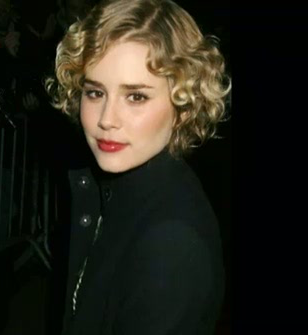

In [128]:
to_pil = torchvision.transforms.ToPILImage()
to_pil(dataset[0][0])

In [124]:
mtcnn = facenet_pytorch.MTCNN(image_size=224, margin=0)

In [130]:
dataset.resize(1000, 1000, 1000)
len(dataset)

10000000000

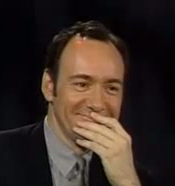

In [131]:
img = to_pil(dataset[1200000000][0])
img

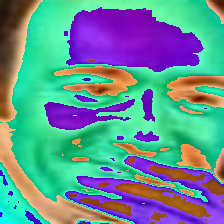

In [132]:
img_face = mtcnn(img)
to_pil(img_face)

In [106]:
facenet = facenet_pytorch.InceptionResnetV1(pretrained='vggface2').eval()

In [111]:
from torchinfo import summary
summary(facenet, (1, 3, 224, 224))

Layer (type:depth-idx)                        Output Shape              Param #
InceptionResnetV1                             [1, 512]                  4,427,703
├─BasicConv2d: 1-1                            [1, 32, 111, 111]         --
│    └─Conv2d: 2-1                            [1, 32, 111, 111]         864
│    └─BatchNorm2d: 2-2                       [1, 32, 111, 111]         64
│    └─ReLU: 2-3                              [1, 32, 111, 111]         --
├─BasicConv2d: 1-2                            [1, 32, 109, 109]         --
│    └─Conv2d: 2-4                            [1, 32, 109, 109]         9,216
│    └─BatchNorm2d: 2-5                       [1, 32, 109, 109]         64
│    └─ReLU: 2-6                              [1, 32, 109, 109]         --
├─BasicConv2d: 1-3                            [1, 64, 109, 109]         --
│    └─Conv2d: 2-7                            [1, 64, 109, 109]         18,432
│    └─BatchNorm2d: 2-8                       [1, 64, 109, 109]         128
│   

In [133]:
dataset = YouTubeFacesDataset(df, data_dir, cache_lim = 1)
len(dataset)

Loading data: 100%|██████████| 10/10 [00:00<00:00, 166.14it/s]


10

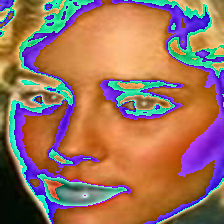

In [150]:
to_pil(dataset[0][0])

In [142]:
v = facenet(dataset[0][0].reshape(1, 3, 224, 224)).detach().numpy()
v.shape

(1, 512)

In [143]:
v

array([[-2.14132331e-02, -1.34678958e-02,  2.97545884e-02,
        -2.12641973e-02,  1.81564428e-02,  2.12297086e-02,
        -3.30719277e-02, -6.76371381e-02,  8.83044302e-02,
         5.44792451e-02, -1.85321793e-02,  8.41436535e-03,
         1.93722208e-03, -1.52405454e-02, -2.42430512e-02,
        -9.27518820e-04,  8.25286582e-02,  5.13459891e-02,
         2.99685658e-03,  1.71748344e-02, -4.08964343e-02,
        -5.76288961e-02,  6.71082214e-02,  1.78662911e-02,
        -4.90780585e-02,  1.36911450e-02, -8.32190588e-02,
         2.33829897e-02, -5.95465004e-02,  3.07294279e-02,
        -6.04271181e-02, -9.97394230e-03, -1.18522912e-01,
        -9.03697908e-02,  1.73595473e-02, -6.07336313e-03,
         1.43165281e-02, -8.87383297e-02, -6.43608570e-02,
         3.49527262e-02, -9.71149560e-03,  4.63640019e-02,
        -6.73919097e-02,  5.21224923e-02,  2.82074530e-02,
        -2.49318574e-02,  8.62416774e-02,  2.83701643e-02,
        -5.72973210e-03, -2.65658181e-02, -1.18682608e-0

In [113]:
def cos_similarity(v1, v2):
    val = np.inner(v1,v2)/(np.linalg.norm(v1)*np.linalg.norm(v2))
    return val.reshape(-1)[0]

def euc_similarity(v1, v2):
    return np.linalg.norm(v1-v2)

In [161]:
def validate(model, dataset, cnt = 20):
    _, axs = plt.subplots(nrows=cnt, ncols=3, figsize=(3*4, cnt*4))
    for i in range(cnt):
        idx = random.randint(0, len(dataset)-1)
        img1, img2, img3 = dataset[idx]
        v1 = model(img1.reshape(1, 3, 224, 224)).detach().numpy()
        v2 = model(img2.reshape(1, 3, 224, 224)).detach().numpy()
        v3 = model(img3.reshape(1, 3, 224, 224)).detach().numpy()
        title = '%d %f %f %f %f %f %f' % (idx,
            euc_similarity(v1, v2), euc_similarity(v1, v3),
            cos_similarity(v1, v2), cos_similarity(v1, v3),
            np.vstack((v1, v2, v3)).min(), np.vstack((v1, v2, v3)).max())
        plt.sca(axs[i, 0])
        plt.imshow(to_pil(img1))
        plt.axis('off')
        plt.sca(axs[i, 1])
        plt.imshow(to_pil(img2))
        plt.axis('off')
        plt.title(title)
        plt.sca(axs[i, 2])
        plt.imshow(to_pil(img3))
        plt.axis('off')
        print(title)

8 1.269162 1.511549 0.194614 -0.142390 -0.155198 0.129717
7 0.302263 1.387810 0.954318 0.036992 -0.159932 0.131749
2 1.052769 1.436570 0.445838 -0.031866 -0.126315 0.132442
5 0.592517 1.307426 0.824462 0.145319 -0.146689 0.131256
0 0.614526 1.382818 0.811179 0.043908 -0.157458 0.152637
2 0.765942 1.216003 0.706667 0.260669 -0.141309 0.134652
3 0.644558 1.116470 0.792273 0.376748 -0.126848 0.127135
3 0.991728 1.103121 0.508238 0.391562 -0.131895 0.125980
0 0.868814 1.436716 0.622581 -0.032077 -0.134831 0.140488
3 0.675634 1.577203 0.771760 -0.243785 -0.148223 0.133819
1 0.748893 1.410718 0.719580 0.004938 -0.137595 0.145830
5 0.727551 1.628963 0.735335 -0.326761 -0.164042 0.128102
4 1.184109 1.160660 0.298943 0.326434 -0.149972 0.130826
5 0.702769 0.968437 0.753058 0.531065 -0.156586 0.132879
7 0.403744 1.431016 0.918495 -0.023904 -0.153864 0.146596
8 0.693912 1.588437 0.759243 -0.261566 -0.135642 0.142049
2 0.700363 1.215280 0.754746 0.261548 -0.143666 0.138773
4 0.864026 1.474834 0.62

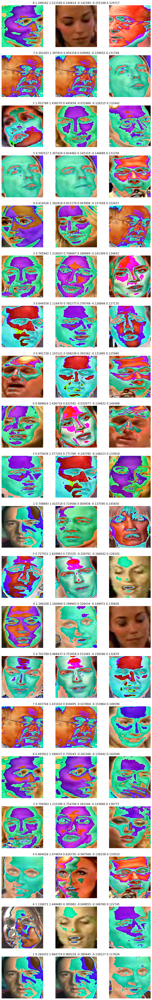

In [148]:
validate(facenet, dataset)

---

In [158]:
dataset = YouTubeFacesDataset(df, data_dir, cache_lim = 1, transform=ResizeTransform())
len(dataset)

Loading data: 100%|██████████| 10/10 [00:00<00:00, 210.50it/s]


10

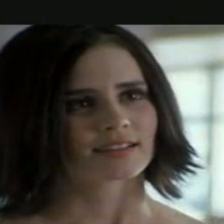

In [159]:
to_pil(dataset[0][0])

4 0.997879 1.366936 0.502119 0.065742 -0.128296 0.153355
8 0.476941 1.243223 0.886264 0.227199 -0.147100 0.137922
1 0.611531 1.375593 0.813015 0.053872 -0.136858 0.131641
3 0.668250 1.114401 0.776721 0.379055 -0.123549 0.131535
5 0.826867 1.497361 0.658145 -0.121045 -0.127064 0.140487
6 0.667129 1.169846 0.777469 0.315730 -0.127447 0.134926
5 0.732787 0.997402 0.731512 0.502594 -0.127158 0.149448
2 0.693922 1.251073 0.759236 0.217408 -0.123503 0.139657
7 0.784253 1.480849 0.692473 -0.096456 -0.141884 0.134230
2 0.970175 1.477323 0.529380 -0.091242 -0.137286 0.160464
1 0.967660 0.849051 0.531817 0.639556 -0.129753 0.136756
9 0.853258 1.315163 0.635975 0.135174 -0.148789 0.144407
1 0.822200 1.374656 0.661994 0.055160 -0.135340 0.154193
8 1.276690 1.598390 0.185032 -0.277425 -0.144442 0.146349
9 1.085134 1.611668 0.411242 -0.298738 -0.141872 0.136733
4 0.957839 1.332238 0.541272 0.112570 -0.130465 0.141581
8 1.132616 1.292502 0.358591 0.164719 -0.142705 0.134244
7 1.032790 1.310145 0.4666

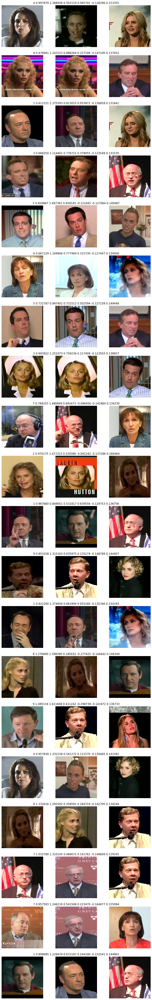

In [160]:
validate(facenet, dataset)

---

In [162]:
dataset = YouTubeFacesDataset(df, data_dir, cache_lim = 1, transform=NormalizeTransform())
len(dataset)

Loading data: 100%|██████████| 10/10 [00:00<00:00, 198.29it/s]


10

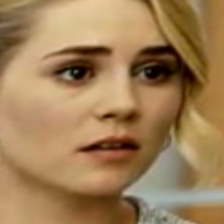

In [163]:
to_pil(dataset[0][0])

1 0.125177 1.429222 0.992165 -0.021337 -0.149061 0.115162
2 0.982844 1.401459 0.517009 0.017957 -0.140328 0.136897
4 0.843516 1.459873 0.644240 -0.065614 -0.139366 0.132429
2 1.154001 1.566032 0.334141 -0.226229 -0.134647 0.144921
5 0.451370 1.453051 0.898133 -0.055678 -0.166951 0.168175
6 0.558361 1.236905 0.844117 0.235033 -0.139089 0.139363
7 0.929420 1.471833 0.568089 -0.083146 -0.133319 0.148717
9 0.123223 1.396401 0.992408 0.025032 -0.136942 0.127367
0 0.864719 1.451686 0.626130 -0.053696 -0.136165 0.144361
3 0.870570 1.507727 0.621054 -0.136620 -0.131537 0.127630
9 0.222504 1.514796 0.975246 -0.147303 -0.149244 0.158271
6 0.599331 1.427867 0.820401 -0.019402 -0.133148 0.137214
4 1.155787 1.427477 0.332078 -0.018845 -0.142162 0.151082
9 1.091693 1.466005 0.404103 -0.074585 -0.150419 0.148359
9 0.333192 1.329805 0.944492 0.115810 -0.142595 0.137268
8 0.451059 1.453714 0.898273 -0.056642 -0.137839 0.127997
2 1.258727 1.197741 0.207803 0.282708 -0.140454 0.127214
2 1.248797 1.526153

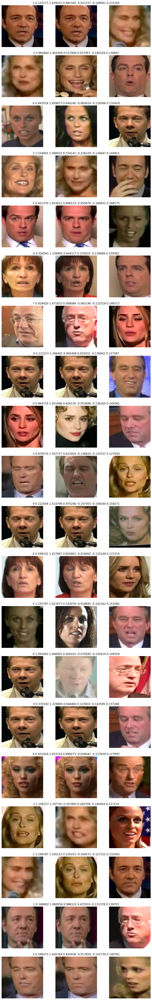

In [164]:
validate(facenet, dataset)

---